<a href="https://colab.research.google.com/github/marielaAriass/modelo_operonEgoista/blob/main/scripts/modelo_OE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import random
import matplotlib.pyplot as plt

### Parámetros

In [ ]:
# Iniciar la poblacion
M = 5000 #kb. Tamaño del genoma
g = 4 # Genes en la via de interes
num_especies = 100 #Num de especies para iniciar la poblacion

# Reorganizar el genoma por cada especie
rho = 0.001 # probabilidad de reacomodo

# Destruir función de especie positiva
lambd = 0.001 # probabilidad de perdida de la funcion

# Transferencia horizontal
tau0 = 0.01 # probabilidad maxima de transferencia horizontal
alpha = 0.004

#Simulación
num_iteraciones = 50000

e = 25 #kb.  tolerancia al equilibrio entre el origen y el término

### Iniciar la población

In [ ]:
# Iniciar la población con 10 especies positivas
# Cada especie es de tamaño M
# Las especies positivas deben de tener g 1's en el genoma
# Los demás serán 0's

def inicializar_poblacion(M, num_especies, g):
    especies_positivas = []
    for _ in range(num_especies):
        genoma = [0] * M
        genes_asignados = 0

        while genes_asignados < g:
            indice_aleatorio = random.randint(0, M - 1)
            if genoma[indice_aleatorio] == 0:
                genoma[indice_aleatorio] = 1
                genes_asignados += 1

        especies_positivas.append(genoma)

    return especies_positivas

poblacion = inicializar_poblacion(M, num_especies, g)
poblacion

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


### Reorganizar la población

In [ ]:
# Tenemos la proba rho = 0.01 y la poblacion anterior.
# Para cada especie de la poblacion lo siguiente:
# -Escoger un numero aleatorio entre 0 y 1
#   -si este es mayor o igual a rho, el reacomodo sucede
# Escoger dos posiciones aleatorias (que no sean la misma)
# Una de las posiciones se cambiara al lugar de la otra posicion
# tenemos nuestra nueva poblacion

def reorganizar_genoma(poblacion, rho):
    nueva_poblacion = []
    for especie in poblacion:
        #print("Original:", especie)  # Imprimir la especie original
        aleatorio = random.uniform(0, 1)

        if aleatorio >= rho:
            pos1 = random.randint(0, len(especie) - 1)
            pos2 = random.randint(0, len(especie) - 1)

            while pos1 == pos2: # Este ciclo es para que no sea la misma posición seleccionada
                pos2 = random.randint(0, len(especie) - 1)

            #print(f"Posiciones seleccionadas: {pos1} y {pos2}")

            # Intercambiar las posiciones
            if pos1 < pos2:
                especie.insert(pos1, especie.pop(pos2))
            else:
                especie.insert(pos1 - 1, especie.pop(pos2))

        #print("Modificado:", especie)  # Imprimir la especie modificada
        nueva_poblacion.append(especie)

    return nueva_poblacion


#rho = 0
poblacion_reorganizada = reorganizar_genoma(poblacion, rho)
poblacion_reorganizada

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


### Destruir especie

In [ ]:
# Tomamos la poblacion_reorganizada
# Por cada especie:
# Escoger un numero aleario y si es mayor o igual a lambd eliminar la especie

def destruir_especies(poblacion_reorganizada, lambd):
    nueva_poblacion = []

    for especie in poblacion_reorganizada:
        aleatorio = random.uniform(0, 1)

        if aleatorio < lambd:
            # Si el número aleatorio es menor que la probabilidad lambd, se destruye la especie
            continue

        nueva_poblacion.append(especie)

    return nueva_poblacion

#lambd = 0.5
nueva_poblacion = destruir_especies(poblacion_reorganizada, lambd)
nueva_poblacion


[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


### Distancia arco

In [ ]:
def posiciones(lista, long):
    contador = 1
    posiciones_ones = []
    for i in range(long):
        if lista[i] == 1:
            posiciones_ones.append(i)
            contador += 1
    return posiciones_ones

def procesar_posiciones(posiciones_1, long):
    p1_idx = 0
    p2_idx = -1
    diferencias = []

    while True:
        p1 = posiciones_1[p1_idx]
        p2 = posiciones_1[p2_idx]

        if p1 > p2:
            p2 += long

        diferencia = abs(p1 - p2)
        diferencias.append(diferencia)
        #print(f"|p1={p1} - p2={p2}| => {diferencia}")

        p1_idx += 1
        p2_idx += 1

        if p1_idx >= len(posiciones_1) or p2_idx >= len(posiciones_1):
            break

        p2 %= long

    return diferencias

def distancia_arco(especie, long):
    posiciones1 = posiciones(especie, long)
    p_posiciones1 = procesar_posiciones(posiciones1, long)
    distancia_arco = min(p_posiciones1)
    return distancia_arco

### Transferencia horizontal

In [ ]:
def transferencia_horizontal(nueva_poblacion, tau0, alpha):
    if len(nueva_poblacion) < 900:
        # Calculamos la probabilidad de transferencia horizontal para cada especie
        probabilidades = []
        for especie in nueva_poblacion:
            distancia_i = distancia_arco(especie, len(especie))
            prob = tau0 * np.exp(alpha * distancia_i)
            probabilidades.append(prob)

        # Para cada especie, comprobamos si se produce la transferencia horizontal
        especies_duplicadas = []
        for i, especie in enumerate(nueva_poblacion):
            aleatorio = random.uniform(0, 1)
            if aleatorio >= probabilidades[i]:
                # Si la probabilidad es mayor o igual que el número aleatorio, duplicamos la especie
                especies_duplicadas.append(especie)

        nueva_poblacion += especies_duplicadas

    return nueva_poblacion


In [ ]:
poblacion_final = transferencia_horizontal(nueva_poblacion, tau0, alpha)
poblacion_final

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


### Distancia arco promedio

In [ ]:
def promedio_distancia_arco_poblacion(poblacion, long):
    total_distancias = 0
    total_especies = len(poblacion)

    for especie in poblacion:
        distancia_i = distancia_arco(especie, long)
        total_distancias += distancia_i

    promedio = total_distancias / total_especies

    return promedio


In [ ]:
mi_promedio = promedio_distancia_arco_poblacion(poblacion_final, M)
print("El promedio de la distancia de arco en la población es:", mi_promedio)


El promedio de la distancia de arco en la población es: 2346.3009708737864


### Simulación

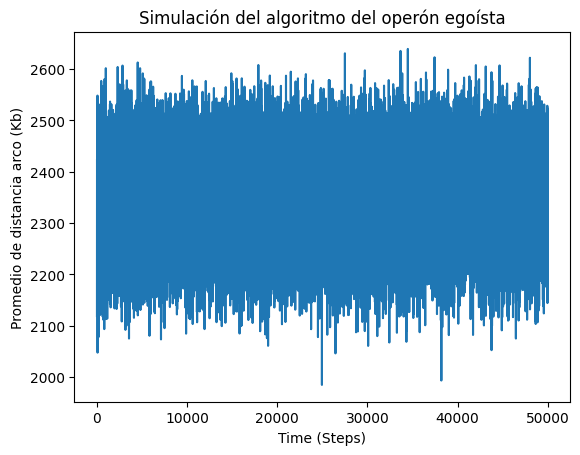

In [ ]:
# Lista para almacenar el promedio de i en cada iteración
promedios = []

for i in range(num_iteraciones):
    # Inicializar la población
    poblacion = inicializar_poblacion(M, num_especies, g)

    # Reorganizar el genoma
    poblacion_reorganizada = reorganizar_genoma(poblacion, rho)

    # Destruir especies
    nueva_poblacion = destruir_especies(poblacion_reorganizada, lambd)

    # Transferencia horizontal
    poblacion_final = transferencia_horizontal(nueva_poblacion, tau0, alpha)

    # Calcular el promedio de i
    promedio = promedio_distancia_arco_poblacion(poblacion_final, M)

    # Agregar el promedio a la lista
    promedios.append(promedio)

# Graficar los resultados
plt.plot(promedios)
plt.xlabel('Time (Steps)')
plt.ylabel('Promedio de distancia arco (Kb)')
plt.title('Simulación del algoritmo del operón egoísta')
#plt.show()
plt.savefig("simulacion.png")

### Simulación con distintos rho

### Correccion de traslocación

In [ ]:
# Se hizo la correccion en la probabilidad rho
# Ahora es rho*(g/M)
def reorganizar_genoma_corregido(poblacion, rho):
    nueva_poblacion = []
    for especie in poblacion:
        #print("Original:", especie)  # Imprimir la especie original
        aleatorio = random.uniform(0, 1)

        if aleatorio >= rho*(g / M):
            pos1 = random.randint(0, len(especie) - 1)
            pos2 = random.randint(0, len(especie) - 1)

            while pos1 == pos2: # Este ciclo es para que no sea la misma posición seleccionada
                pos2 = random.randint(0, len(especie) - 1)

            #print(f"Posiciones seleccionadas: {pos1} y {pos2}")

            # Intercambiar las posiciones
            if pos1 < pos2:
                especie.insert(pos1, especie.pop(pos2))
            else:
                especie.insert(pos1 - 1, especie.pop(pos2))

        #print("Modificado:", especie)  # Imprimir la especie modificada
        nueva_poblacion.append(especie)

    return nueva_poblacion


#rho = 0
poblacion_reorganizada = reorganizar_genoma_corregido(poblacion, rho)
poblacion_reorganizada

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


### Simulación con corrección

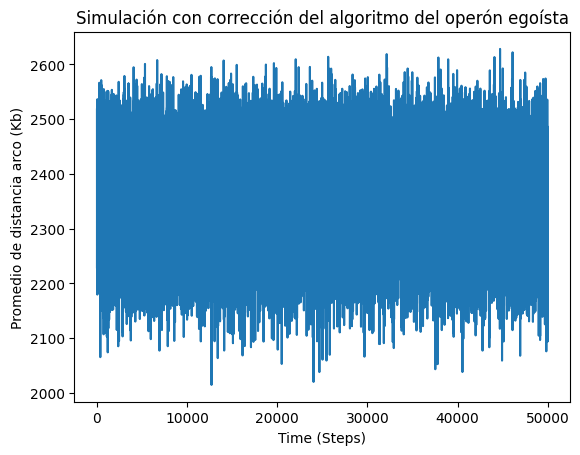

In [ ]:
# Lista para almacenar el promedio de i en cada iteración
promedios = []

for i in range(num_iteraciones):
    # Inicializar la población
    poblacion = inicializar_poblacion(M, num_especies, g)

    # Reorganizar el genoma
    poblacion_reorganizada = reorganizar_genoma_corregido(poblacion, rho)

    # Destruir especies
    nueva_poblacion = destruir_especies(poblacion_reorganizada, lambd)

    # Transferencia horizontal
    poblacion_final = transferencia_horizontal(nueva_poblacion, tau0, alpha)

    # Calcular el promedio de i
    promedio = promedio_distancia_arco_poblacion(poblacion_final, M)

    # Agregar el promedio a la lista
    promedios.append(promedio)

# Graficar los resultados
plt.plot(promedios)
plt.xlabel('Time (Steps)')
plt.ylabel('Promedio de distancia arco (Kb)')
plt.title('Simulación con corrección del algoritmo del operón egoísta')
#plt.show()
plt.savefig("simulacion_correccion.png")